In [1]:
#dependencies
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline

In [2]:
#collect data
def gather_data():
    images = []
    labels = []
    labels_dic = {}
    names = [fname for fname in os.listdir('training_images/')]
    for i, name in enumerate(names):
        labels_dic[i] = name
        for image in os.listdir("training_images/"+name):
            temp_image = cv2.imread("training_images/"+name+"/"+image)
            face = crop_face(cv2.cvtColor(temp_image, cv2.COLOR_BGR2GRAY))
            if face is not None:
                #comment the plt show lines to avoid the face outputs
                plt.imshow(face)
                plt.show()
                #reshape the all the training faces to equal size
                if (face.shape > (50,50)):
                    resize = cv2.resize(face, (50,50),
                                       interpolation = cv2.INTER_AREA)
                else:
                    resize = cv2.resize(face, (50, 50),
                                       interpolation = cv2.INTER_CUBIC)
                images.append(resize)
                labels.append(i)
    return (images, np.array(labels),labels_dic)

In [3]:
#detect and crop the face in the image
#assumiing the image has only one face
def crop_face(image):
    #importing the Haar's Cascade Classifier
    detector = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
    face_coord = detector.detectMultiScale(image)
    for (x, y, z, w) in face_coord:
        face_frame = image[y:y+w, x:x+z]
        return face_frame

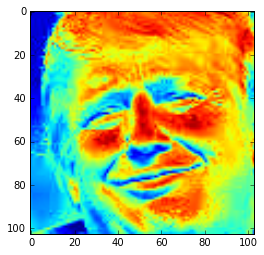

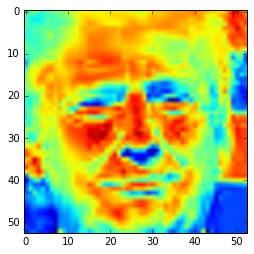

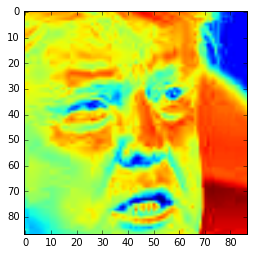

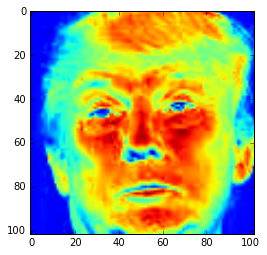

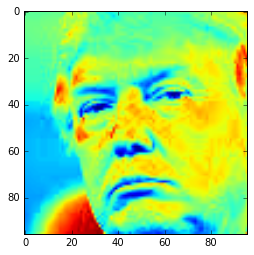

...

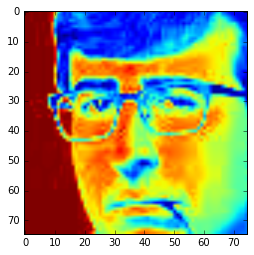

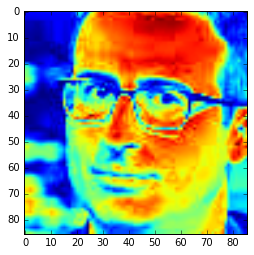

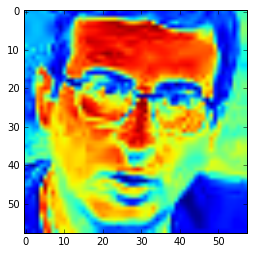

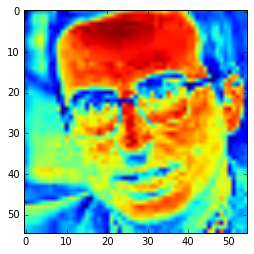

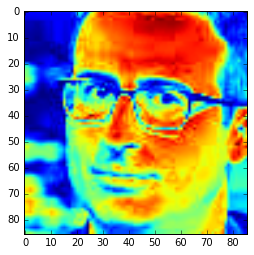

In [14]:
images, labels, labels_dic = gather_data()

In [17]:
recognition_model = cv2.face.createEigenFaceRecognizer()
recognition_model.train(images, labels)

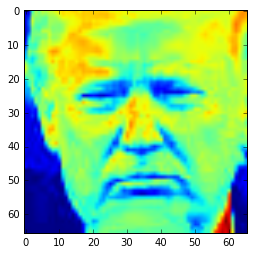

donald_trump
confidence: 1912.3890458482522


In [19]:
test_image = cv2.imread('test_trump.jpg',0)
frame = crop_face(test_image)
plt.imshow(frame)
plt.show()
if (frame.shape > (50,50)):
    resize = cv2.resize(frame, (50,50),
                        interpolation = cv2.INTER_AREA)
else:
    resize = cv2.resize(frame, (50, 50),
                        interpolation = cv2.INTER_CUBIC)
prediction, confidence = recognition_model.predict(resize)
print(labels_dic[prediction])
print("confidence:", confidence)